In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader

import plotly.graph_objects as go
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

from tqdm.auto import tqdm
from loguru import logger

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#####################
## UNet Components ##
#####################

from ddpm_components import DoubleConv, Down, SelfAttention, Up

###############
## Utilities ##
###############

from utils import get_data, create_diffusion_animation

In [4]:
#######################
## UNet architecture ##
#######################

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, time_dim=256, device=device): # in_channels and out_channels are all 3 since dealing with RGB images
        super().__init__()
        self.device = device
        self.time_dim = time_dim

        # Initial Conv
        self.initial_conv = DoubleConv(in_channels, 64)
        
        # Encoder (Down)
        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128, 32)
        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256, 16)
        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256, 8)
        
        # Bottle-neck
        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)
        
        # Decoder (Up)
        self.up1 = Up(512, 128)
        self.sa4 = SelfAttention(128, 16)
        self.up2 = Up(256, 64)
        self.sa5 = SelfAttention(64, 32)
        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64, 64)
        
        # Out Conv
        self.out_conv = nn.Conv2d(64, out_channels, kernel_size=1)
        
    def pos_encoding(self, t, channels):
        inv_freq = 1. / (
            10000
            ** (torch.arange(0, channels, 2, device=self.device).float() / channels)
        )
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc
    
    def forward(self, x, t):
        t = t.unsqueeze(-1).type(torch.float) # make t becomes column vector
        t = self.pos_encoding(t, self.time_dim)
        
        # Down
        x1 = self.initial_conv(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)
        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)
        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)
        
        # Bottle-neck
        x4 = self.bot1(x4)
        x4 = self.bot2(x4)
        x4 = self.bot3(x4)
        
        # Up
        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)
        out = self.out_conv(x)
        return out

In [6]:
####################
## pokemon images ##
####################

import gc
gc.collect()
torch.cuda.empty_cache()

from datasets import load_dataset
pokemon = load_dataset(path="reach-vb/pokemon-blip-captions", split="train")
pokemon = pokemon['image']

Training:   0%|          | 0/4000 [00:00<?, ?it/s]

++++++++++++++++++++++++++++++++++++++++++++++++++
Epoch: 1 | Loss: 0.3143062988917033 | Current LR: 0.0002


Sampling: 0it [00:00, ?it/s]

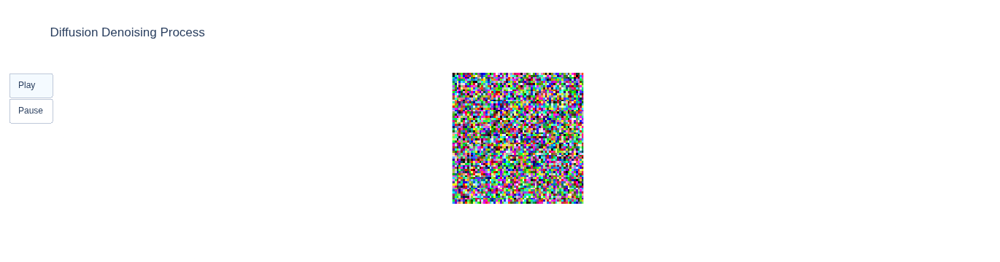

++++++++++++++++++++++++++++++++++++++++++++++++++
Epoch: 1000 | Loss: 0.01094572624805594 | Current LR: 0.0002


Sampling: 0it [00:00, ?it/s]

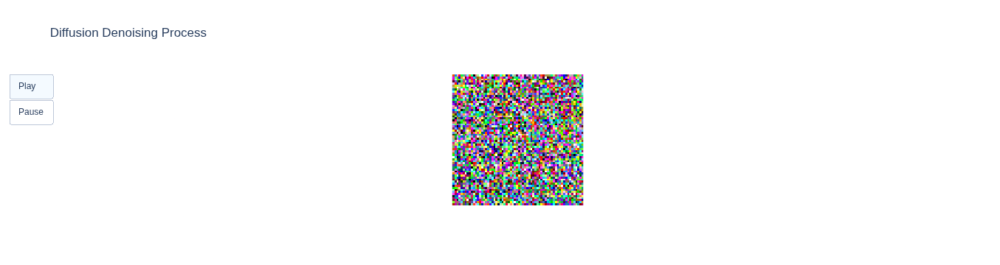

++++++++++++++++++++++++++++++++++++++++++++++++++
Epoch: 2000 | Loss: 0.010302631416180659 | Current LR: 0.0002


Sampling: 0it [00:00, ?it/s]

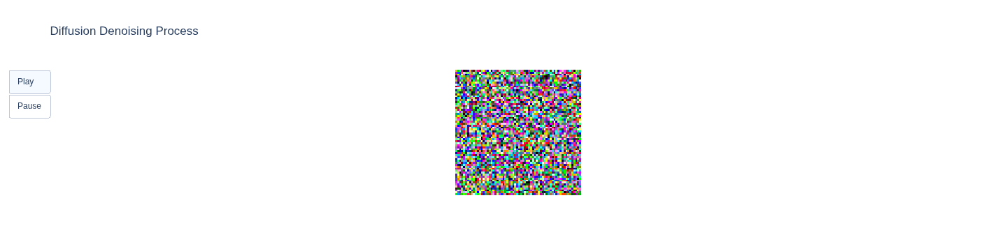

++++++++++++++++++++++++++++++++++++++++++++++++++
Epoch: 3000 | Loss: 0.007247730423252852 | Current LR: 0.0002


Sampling: 0it [00:00, ?it/s]

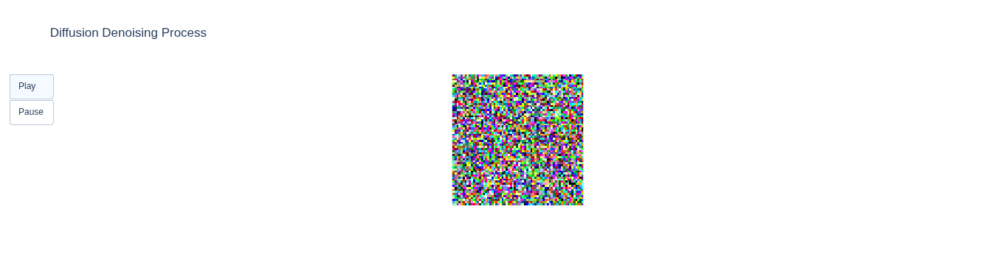

++++++++++++++++++++++++++++++++++++++++++++++++++
Epoch: 4000 | Loss: 0.004530894563123141 | Current LR: 0.00016


Sampling: 0it [00:00, ?it/s]

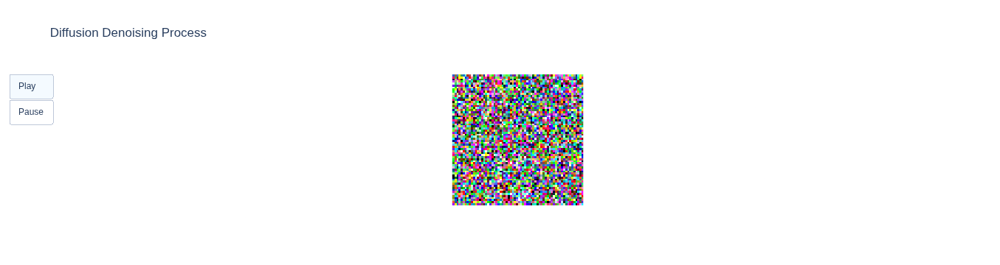

In [38]:
####################
## Trainning loop ##
####################

IMG_SIZE = 64
BATCH_SIZE = 8

torch.manual_seed(42)
model = UNet().to(device=device)

#-------
## Train
#-------

from ddpm_components import train

train(model=model, data=pokemon, epochs=4000, img_size=IMG_SIZE, batch_size=BATCH_SIZE, report_interval=1000, visualize=True)

In [40]:
################
## Save model ##
################

path = "/home/longdpt/Documents/Long_AISDL/DeepLearning_PyTorch/06_DDPM"

torch.save(obj=model, f=path+"/pokemon_generator.pth")

Sampling: 0it [00:00, ?it/s]

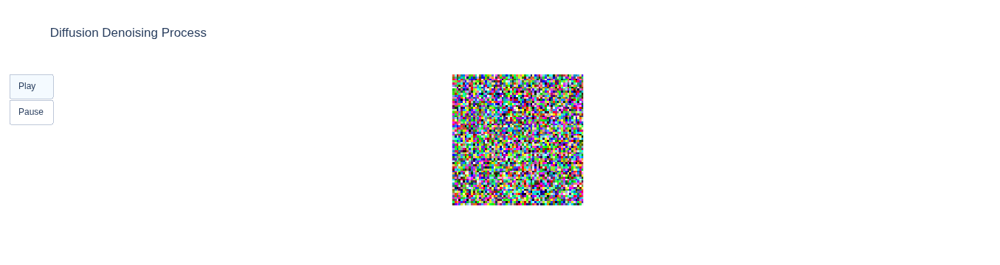

Sampling: 0it [00:00, ?it/s]

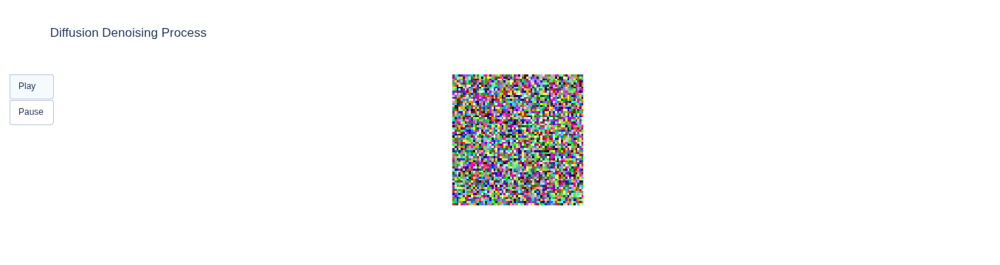

Sampling: 0it [00:00, ?it/s]

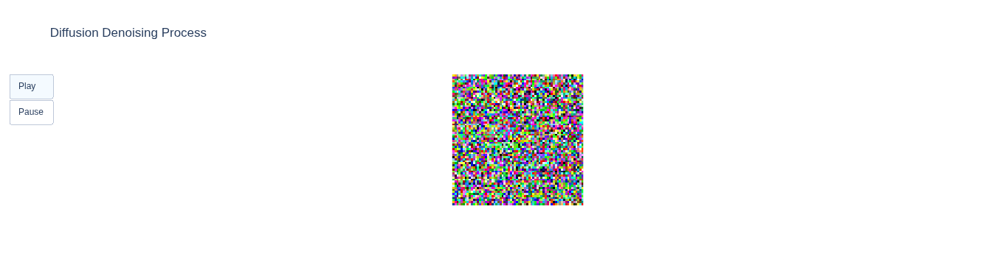

Sampling: 0it [00:00, ?it/s]

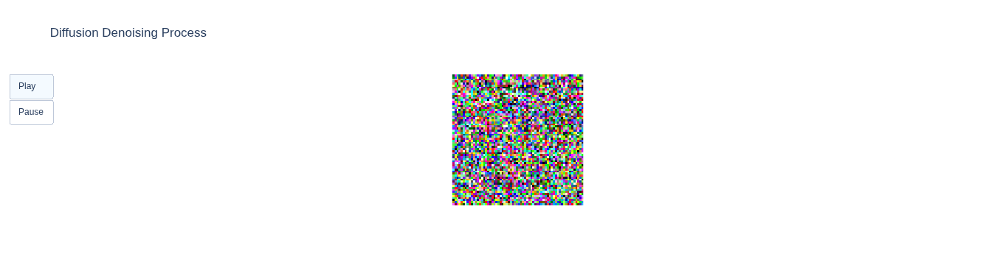

Sampling: 0it [00:00, ?it/s]

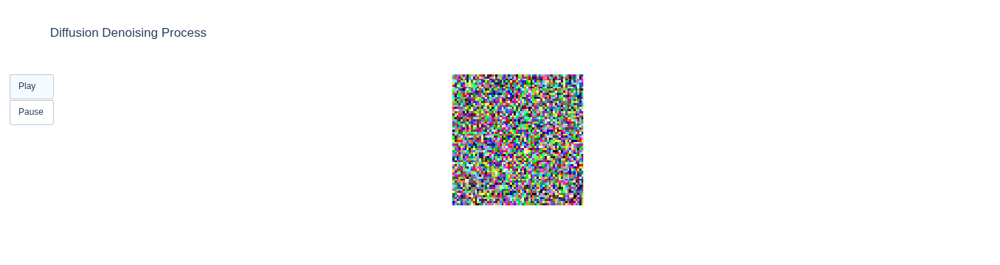

Sampling: 0it [00:00, ?it/s]

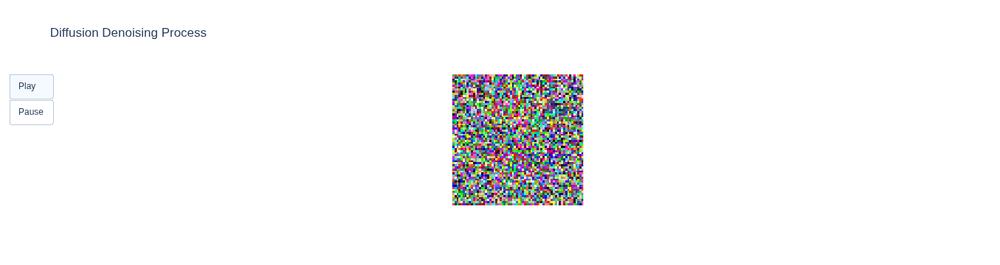

Sampling: 0it [00:00, ?it/s]

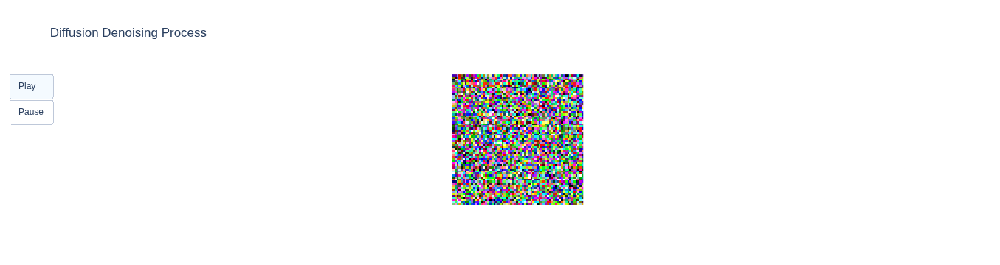

Sampling: 0it [00:00, ?it/s]

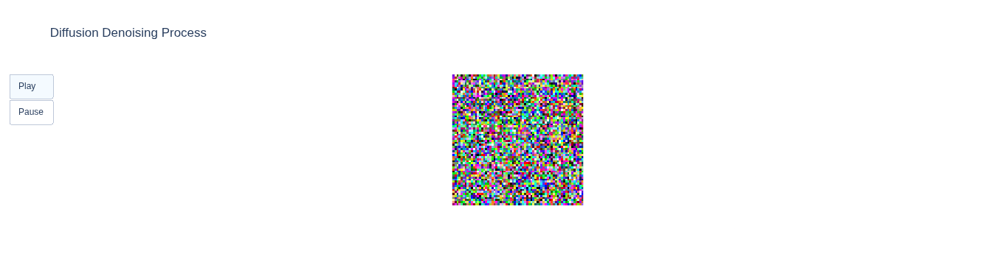

Sampling: 0it [00:00, ?it/s]

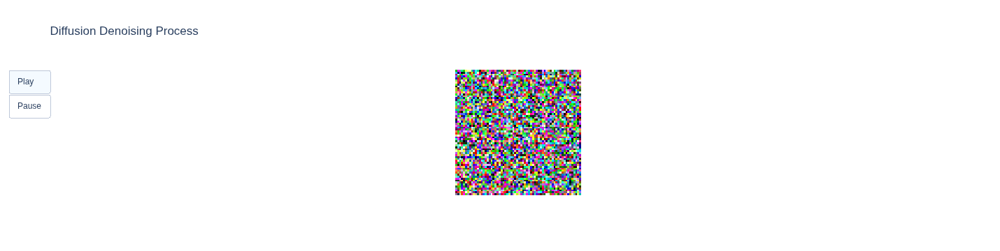

Sampling: 0it [00:00, ?it/s]

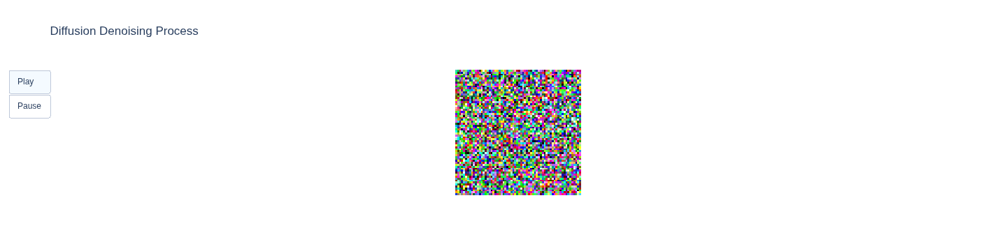

Sampling: 0it [00:00, ?it/s]

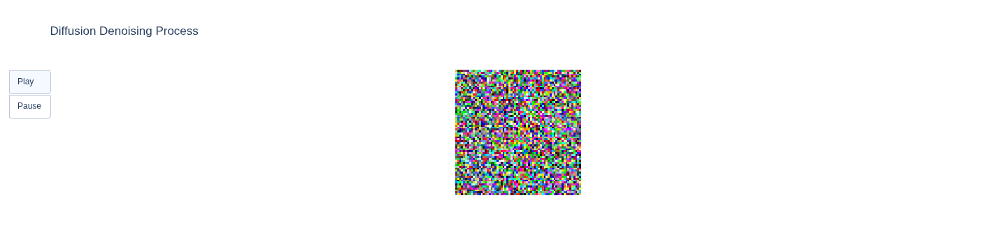

Sampling: 0it [00:00, ?it/s]

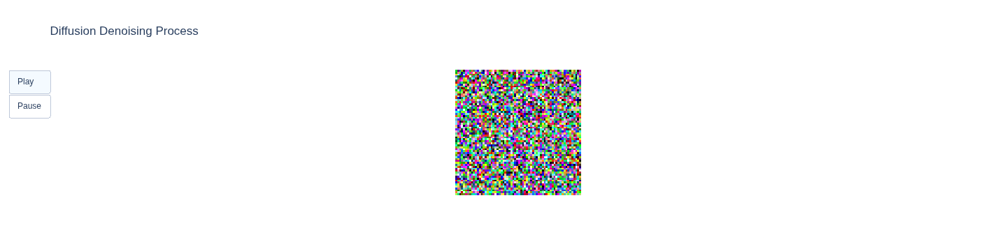

Sampling: 0it [00:00, ?it/s]

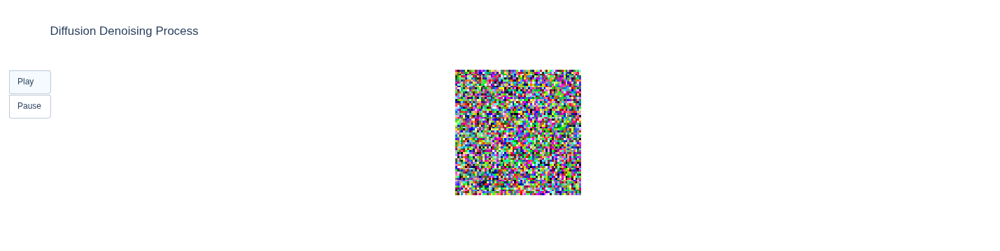

Sampling: 0it [00:00, ?it/s]

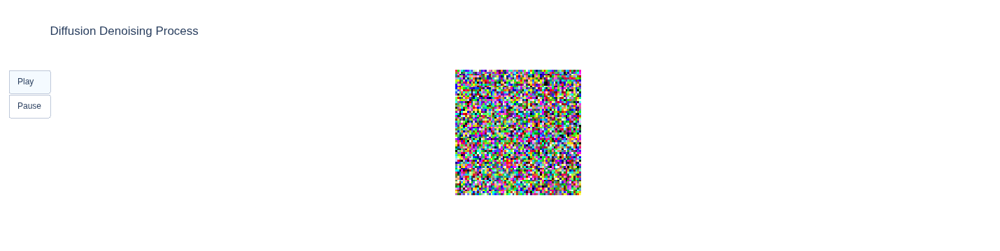

Sampling: 0it [00:00, ?it/s]

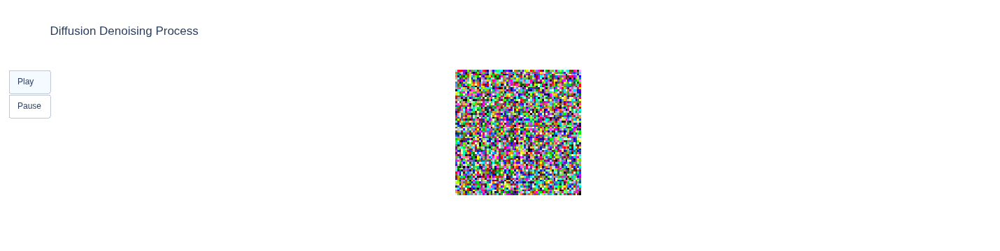

Sampling: 0it [00:00, ?it/s]

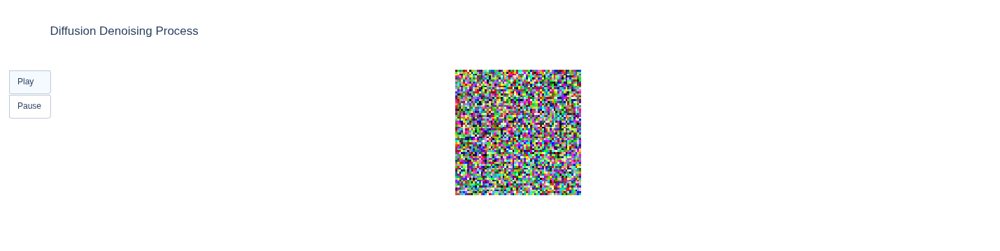

Sampling: 0it [00:00, ?it/s]

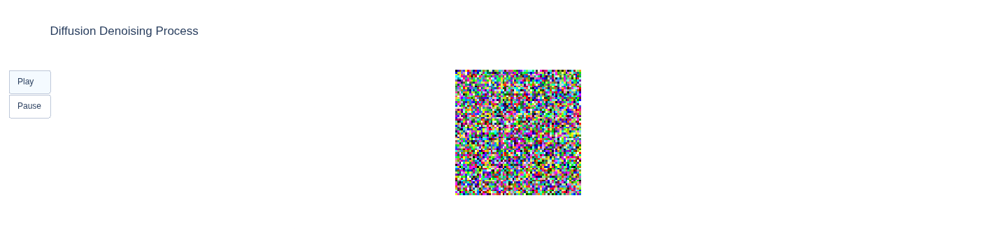

Sampling: 0it [00:00, ?it/s]

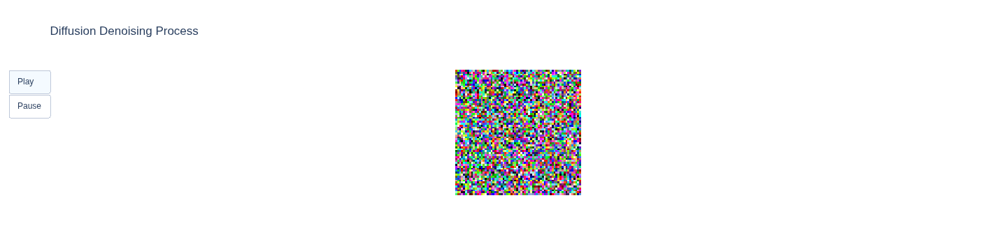

Sampling: 0it [00:00, ?it/s]

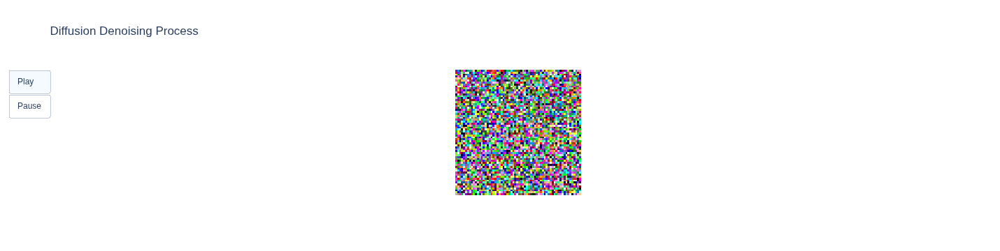

Sampling: 0it [00:00, ?it/s]

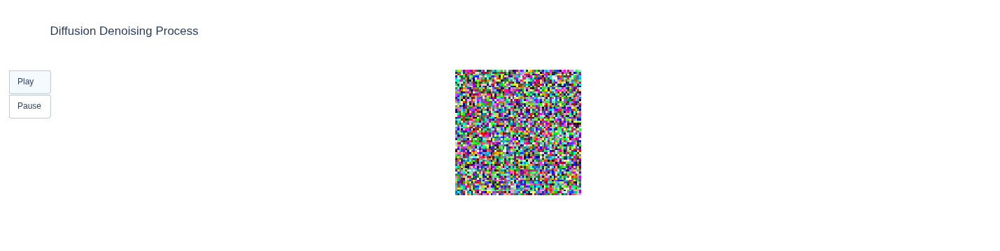

In [6]:
##############
## Sampling ##
##############

path = "/home/longdpt/Documents/Long_AISDL/DeepLearning_PyTorch/06_DDPM"

model_loaded = torch.load(f=path+"/pokemon_generator.pth", weights_only=False)
diffusion = Diffusion(img_size=64, device=device)

for _ in range(20):
    _, img_list = diffusion.sample(model_loaded, n=1)
    fig = create_diffusion_animation(img_list)
    fig.show()